<a href="https://colab.research.google.com/github/rberezdivin/DCGAN-CIFAR10/blob/master/Copy_of_Copy_of_data_efficient_gans_workingcopy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data-Efficient GANs with DiffAugment

In this tutorial, we will demonstrate 
- How to visualize and evaluate the pretrained models for 100-shot generation; and
- How to train a new network with only 100 images.

**[Differentiable Augmentation (DiffAugment)](https://github.com/mit-han-lab/data-efficient-gans)** is a simple, general method that enables **[Data-Efficient GAN Training](https://github.com/mit-han-lab/data-efficient-gans)** by imposing various types of differentiable augmentations on both real and fake samples for both generator and discriminator training.

![](https://hanlab.mit.edu/projects/data-efficient-gans/imgs/interp.gif)

*Generated using only 100 images of Obama, grumpy cats, pandas, the Bridge of Sighs, the Medici Fountain, the Temple of Heaven, without pre-training.*

## Setup Environment

1. Clone our repo:

In [ ]:
!git clone https://github.com/mit-han-lab/data-efficient-gans

Cloning into 'data-efficient-gans'...
remote: Enumerating objects: 596, done.
remote: Total 596 (delta 0), reused 0 (delta 0), pack-reused 596
Receiving objects: 100% (596/596), 23.08 MiB | 41.04 MiB/s, done.
Resolving deltas: 100% (334/334), done.


2. Go to the DiffAugment-stylegan2 folder:

In [ ]:
%cd data-efficient-gans/DiffAugment-stylegan2

/content/data-efficient-gans/DiffAugment-stylegan2


3. Prepare the preliminaries and define some functions for later uses:

In [ ]:
!pip uninstall -y tensorflow tensorflow-probability
!pip install tensorflow-gpu==1.15.0 tensorflow-datasets==2.1.0

import tensorflow as tf
import os
import numpy as np
import PIL
import IPython
from multiprocessing import Pool
import matplotlib.pyplot as plt

from dnnlib import tflib, EasyDict
from training import misc, dataset_tool
from metrics import metric_base
from metrics.metric_defaults import metric_defaults

def _generate(network_name, num_rows, num_cols, seed, resolution):
  if seed is not None:
    np.random.seed(seed)
  with tf.Session():
    _, _, Gs = misc.load_pkl(network_name)
    z = np.random.randn(num_rows * num_cols, Gs.input_shape[1])
    outputs = Gs.run(z, None, output_transform=dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True))
    outputs = np.reshape(outputs, [num_rows, num_cols, *outputs.shape[1:]])
    outputs = np.concatenate(outputs, axis=1)
    outputs = np.concatenate(outputs, axis=1)
    img = PIL.Image.fromarray(outputs)
    img = img.resize((resolution * num_cols, resolution * num_rows), PIL.Image.ANTIALIAS)
  return img

def generate(network_name, num_rows, num_cols, seed=None, resolution=128):
  with Pool(1) as pool:
    return pool.apply(_generate, (network_name, num_rows, num_cols, seed, resolution))

def _evaluate(network_name, dataset, resolution, metric):
  dataset = dataset_tool.create_dataset(dataset, resolution)
  dataset_args = EasyDict(tfrecord_dir=dataset, resolution=resolution, from_tfrecords=True)
  metric_group = metric_base.MetricGroup([metric_defaults[metric]])
  metric_group.run(network_name, dataset_args=dataset_args, log_results=False)
  return metric_group.metrics[0]._results[0].value

def evaluate(network_name, dataset, resolution=256, metric='fid5k-train'):
  with Pool(1) as pool:
    return pool.apply(_evaluate, (network_name, dataset, resolution, metric))

Uninstalling tensorflow-2.4.1:
  Successfully uninstalled tensorflow-2.4.1
Uninstalling tensorflow-probability-0.12.1:
  Successfully uninstalled tensorflow-probability-0.12.1
     |████████████████████████████████| 411.5MB 42kB/s 
     |████████████████████████████████| 3.1MB 45.7MB/s 
     |████████████████████████████████| 51kB 8.3MB/s 
     |████████████████████████████████| 512kB 13.2MB/s 
     |████████████████████████████████| 3.8MB 51.7MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7540 sha256=bee77a9a7197438d3b9e420e74df76c940ab042cd7c99f04734d07d27708bd06
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
  Found existing installation: tensorflow-estimator 2.4.0
    Uninstalling tensorflow-estimator-2.4.0:
      Successfully uninstalled tensorflow-estimator-2.4.0
  Found existing installation: tensorboard 2.4.1
    Uninstalling tensorboard-2.4.1:
      Successfully unin

## Using the Pre-Trained Models

### 100-Shot Generation Datasets

Let's first visualize the 100-shot Obama dataset. Such a small-scale dataset can be easily collected from the Internet.

Loading images from "datasets/100-shot-obama"
Creating dataset "datasets/100-shot-obama"
Added 100 images.


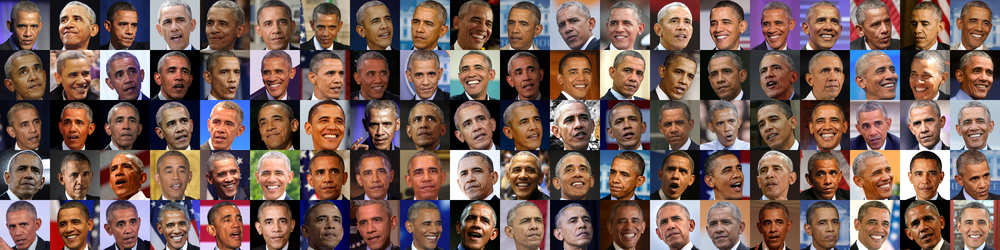

In [ ]:
data_dir = dataset_tool.create_dataset('100-shot-obama')
training_images = []
for fname in os.listdir(data_dir):
  if fname.endswith('.jpg'):
    training_images.append(np.array(PIL.Image.open(os.path.join(data_dir, fname))))
imgs = np.reshape(training_images, [5, 20, *training_images[0].shape])
imgs = np.concatenate(imgs, axis=1)
imgs = np.concatenate(imgs, axis=1)
PIL.Image.fromarray(imgs).resize((1000, 250), PIL.Image.ANTIALIAS)

### StyleGAN2 (baseline)

How do vanilla GANs perform given such a small dataset? Let's visualize the (pre-trained) StyleGAN2 baseline model (this will take a minute):

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.


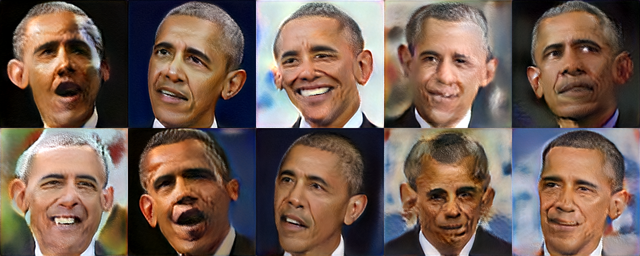

In [ ]:
generate('mit-han-lab:stylegan2-100-shot-obama.pkl', num_rows=2, num_cols=5, seed=1000)

As you can see, most of the images generated by the baseline model are heavily distorted. This is mainly because the discriminator is memorizing the exact training images. Let's resolve this problem with DiffAugment.

###  + DiffAugment (ours)

DiffAugment can dramatically improve the image quality even with only 100 training images of Obama portraits. Here visualizes the (pre-trained) StyleGAN2 + DiffAugment model (this will take a minute):

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


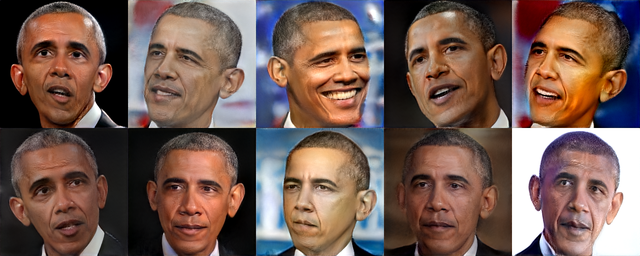

In [ ]:
generate('mit-han-lab:DiffAugment-stylegan2-100-shot-obama.pkl', num_rows=2, num_cols=5, seed=1000)

Besides `100-shot-obama`, you may also try out `100-shot-grumpy_cat`, `100-shot-panda`, `AnimalFace-cat`, or `AnimalFace-dog` in the code above, to compare DiffAugment with the baseline models on other datasets.

### Calculating FID

Fréchet Inception Distance (FID) quatitatively measures the visual fidelity for GANs. Lower FID indicates better performance. Let's do the FID calculation for both the baseline model and ours. This will take about 15 minutes.

Evaluating StyleGAN2 (baseline)...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Baseline FID: 81.10416250748824 

Evaluating StyleGAN2 + DiffAugment (ours)...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Ours FID: 47.07268315371694 



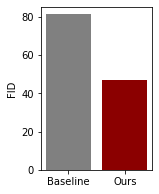

In [ ]:
print('Evaluating StyleGAN2 (baseline)...')
fid_baseline = evaluate('mit-han-lab:stylegan2-100-shot-obama.pkl', dataset='100-shot-obama')
print('Baseline FID:', fid_baseline, '\n')

print('Evaluating StyleGAN2 + DiffAugment (ours)...')
fid_ours = evaluate('mit-han-lab:DiffAugment-stylegan2-100-shot-obama.pkl', dataset='100-shot-obama')
print('Ours FID:', fid_ours, '\n')

plt.figure(figsize=(2, 3))
plt.bar([0, 1], [fid_baseline, fid_ours], color=['gray', 'darkred'])
plt.xticks([0, 1], ['Baseline', 'Ours'])
plt.ylabel("FID")
plt.show()

With DiffAugment, our model is **1.7x** better than the baseline model in terms of FID!

### Generating an Interpolation Video

Finally, let's generate an interpolation video using the pre-trained DiffAugment models. Besides `obama`, you may also try out `grumpy_cat`, `panda`, `bridge_of_sighs`, `medici_fountain`, `temple_of_heaven` in the code below. The smooth interpolation results suggest little overfitting of our method even given small datasets. This will take a minute.

Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


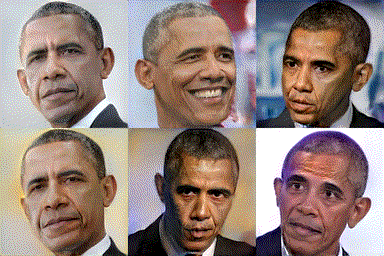

In [ ]:
!python3 generate_gif.py -r mit-han-lab:DiffAugment-stylegan2-100-shot-obama.pkl -o interp.gif --num-rows=2 --num-cols=3 --seed=1
IPython.display.Image(open('interp.gif', 'rb').read())

In [ ]:
!dir

datasets	   generate_gif.py  metrics	  run_ffhq.py
DiffAugment_tf.py  interp.gif	    README.md	  run_low_shot.py
dnnlib		   LICENSE.txt	    run_cifar.py  training


## Training with 100 Images

Due to the resource constraints on Colab, we will train a model at 64x64 resolution on our 100-shot Obama dataset. This still takes quite a long time to complete (usually under 10 hours using the free GPU environment). Checkpoints (`*.pkl`) and generated samples (`*.png`) will be stored in the `results` folder. By specifying the path, these checkpoints can be used in the same way as above for visualization.

In [ ]:
!python3 run_low_shot.py --dataset=100-shot-obama --resolution=16

Loading images from "datasets/100-shot-obama"
Creating dataset "datasets/100-shot-obama"
Added 100 images.
Local submit - run_dir: results/00000-DiffAugment-stylegan2-100-shot-obama-16-batch16-1gpu-color-translation-cutout
dnnlib: Running training.training_loop.training_loop() on localhost...
Streaming data using training.dataset.TFRecordDataset...
Dataset shape = [3, 16, 16]
Dynamic range = [0, 255]
Label size    = 0
Constructing networks...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.

G                           Params    OutputShape       WeightShape     
---                         ---       ---               ---             
latents_in                  -         (?, 512)          -               
labels_in                   -         (?,)              -               
lod                         -         ()                -               
dlatent_avg            

## In the End

Congratulations! You've finished all the content of this tutorial!
Hope you enjoy playing with data-efficient GANs. If you are interested, please refer to our [paper](https://arxiv.org/pdf/2006.10738.pdf) and [GitHub repo](https://github.com/mit-han-lab/data-efficient-gans) for further details.